# How to use PeakOnly in a Jupyter Notebook or general Python script

In [ ]:
Install the `ms-peakonly` library in your environment, e.g. with 

    git clone 
`pip install -e .`

In [2]:
from ms_peakonly import PeakOnly

In [1]:
from glob import glob

In [3]:
po = PeakOnly(model_dir='/home/swacker/.peak_only')

In [4]:
po.maybe_get_models()

In [26]:
fns = glob('/data/Metabolomics/MS-formats/MTBLS1569/mzML/*.mzML')[:2]
fns

['/data/Metabolomics/MS-formats/MTBLS1569/mzML/Control_3h_R2.mzML',
 '/data/Metabolomics/MS-formats/MTBLS1569/mzML/QC_3.mzML']

In [27]:
table = po.process(fns)

Finding ROIs...


100%|██████████| 3831/3831 [00:26<00:00, 142.75it/s]


Aligning ROIs...
Finding peaks...


/home/swacker/workspace/ms-peakonly/ms_peakonly/processing_utils/run_utils.py:32: RuntimeWarning: invalid value encountered in true_divide
  signal = torch.tensor(signal / np.max(signal), dtype=torch.float32, device=device)
  0%|          | 0/2 [00:00<?, ?it/s]

total number of features: 380
zero filling...


100%|██████████| 2/2 [00:03<00:00,  1.50s/it]


In [28]:
table

,mz,rtmin,rtmax,/data/Metabolomics/MS-formats/MTBLS1569/mzML/Control_3h_R2.mzML,/data/Metabolomics/MS-formats/MTBLS1569/mzML/QC_3.mzML
0,87.008711,0.311154,0.313969,4.050207e+04,6.421246e+05
1,89.024270,0.149944,0.164925,5.946541e+06,2.078274e+07
2,94.980561,0.447646,0.472093,6.354852e+07,6.465936e+07
3,96.958868,0.301927,0.317091,1.584294e+07,6.580472e+07
4,96.971704,0.226072,0.249500,1.020892e+08,1.606559e+08
...,...,...,...,...,...
375,751.141891,0.255742,0.263471,5.348547e+05,6.485756e+06
376,763.549978,0.053552,0.063208,3.140993e+08,3.317957e+08
377,1078.583961,0.076131,0.077888,0.000000e+00,5.453032e+06
378,1150.355437,0.251438,0.264092,2.126982e+07,4.830143e+07


In [22]:
import numpy as np 

def to_peaklist(df):
    df = df.copy()
    df = df.rename(columns={'mz': 'mz_mean', 'rtmin': 'rt_min', 'rtmax': 'rt_max'})
    df['rt_min'] = df['rt_min']*60.
    df['rt_max'] = df['rt_max']*60.
    df['rt'] = df[['rt_min', 'rt_max']].mean(axis=1)
    df['peak_label'] = df.mz_mean.apply(lambda x: str(np.round(x, 3))) + '@' + df.rt.apply(lambda x: str(np.round(x, 2)))
    df['mz_width'] = 10 
    df = df.set_index(['peak_label', 'mz_mean', 'mz_width', 'rt', 'rt_min', 'rt_max']).reset_index()
    return df

In [23]:
peaklist = to_peaklist(table)
peaklist.to_csv('onlypeak-generated-peaklist.csv')

In [24]:
peaklist

,peak_label,mz_mean,mz_width,rt,rt_min,rt_max,/data/Metabolomics/MS-formats/MTBLS1569/mzML/Control_3h_R2.mzML,/data/Metabolomics/MS-formats/MTBLS1569/mzML/QC_3.mzML,/data/Metabolomics/MS-formats/MTBLS1569/mzML/QC_4.mzML,/data/Metabolomics/MS-formats/MTBLS1569/mzML/Tx_6h_R3.mzML,...,/data/Metabolomics/MS-formats/MTBLS1569/mzML/Tx_6h_R4.mzML,/data/Metabolomics/MS-formats/MTBLS1569/mzML/Tx_3h_R2.mzML,/data/Metabolomics/MS-formats/MTBLS1569/mzML/Tx_3h_R3.mzML,/data/Metabolomics/MS-formats/MTBLS1569/mzML/Control_6h_R3.mzML,/data/Metabolomics/MS-formats/MTBLS1569/mzML/QC_1.mzML,/data/Metabolomics/MS-formats/MTBLS1569/mzML/Control_1h_R3.mzML,/data/Metabolomics/MS-formats/MTBLS1569/mzML/Tx_6h_R1.mzML,/data/Metabolomics/MS-formats/MTBLS1569/mzML/QC_0.mzML,/data/Metabolomics/MS-formats/MTBLS1569/mzML/Control_6h_R1.mzML,/data/Metabolomics/MS-formats/MTBLS1569/mzML/Control_1h_R4.mzML
0,89.024@9.62,89.024414,10,9.623464,8.723947,10.522980,8.262227e+06,2.180279e+07,2.151939e+07,5.592650e+06,...,3.333295e+06,4.891016e+06,3.827004e+06,1.197425e+07,3.028778e+07,4.979535e+07,8.177849e+06,2.216581e+07,1.061094e+07,1.593368e+07
1,95.982@18.43,95.981662,10,18.433669,15.333724,21.533615,1.355005e+07,9.406974e+06,2.671727e+07,9.188854e+07,...,7.947379e+07,6.256355e+07,7.574625e+07,4.195859e+07,6.234135e+07,1.108990e+07,7.949183e+07,9.437783e+06,1.544879e+07,1.146352e+07
2,96.977@15.26,96.977408,10,15.260836,13.546458,16.975214,2.873860e+07,1.600063e+08,1.729266e+08,1.243925e+08,...,1.741930e+08,2.040043e+08,1.975693e+08,9.411611e+07,1.587139e+08,1.248700e+08,3.552440e+07,1.945903e+08,3.908266e+07,1.269431e+08
3,98.025@9.23,98.024727,10,9.225924,8.918313,9.533534,4.906031e+06,6.356906e+06,3.561808e+06,9.599630e+06,...,4.393779e+06,1.494169e+06,1.397239e+06,1.943173e+06,4.796506e+06,9.997238e+06,1.430469e+07,7.402178e+06,2.587280e+06,6.101533e+06
4,98.967@14.21,98.967161,10,14.207838,13.480699,14.934978,4.194979e+07,6.697605e+07,8.153165e+07,5.464299e+07,...,7.790909e+07,8.190695e+07,7.581123e+07,3.917045e+07,6.994355e+07,3.960844e+07,6.143218e+07,8.255732e+07,2.373351e+07,4.862842e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,751.542@3.51,751.542140,10,3.511300,3.213541,3.809058,1.178029e+08,7.986652e+07,1.028776e+08,3.759427e+07,...,2.302461e+07,3.367113e+07,4.645290e+07,1.204343e+08,1.720684e+08,1.343569e+08,3.940624e+07,6.153484e+07,1.048653e+08,2.715713e+08
293,763.55@3.49,763.550167,10,3.491558,3.196560,3.786555,3.140993e+08,3.317957e+08,2.932165e+08,8.297614e+07,...,1.910152e+08,3.611829e+07,1.736970e+08,2.448353e+08,5.584898e+08,5.973769e+08,9.531005e+07,2.737155e+08,3.925445e+08,8.476121e+08
294,764.553@3.48,764.552987,10,3.475858,3.197596,3.754120,1.185871e+08,1.314399e+08,1.374504e+08,4.088775e+07,...,8.862815e+07,4.431995e+07,6.714168e+07,8.384630e+07,2.538337e+08,2.678900e+08,3.459972e+07,9.862768e+07,1.163601e+08,3.842201e+08
295,777.566@3.5,777.565925,10,3.497944,3.228648,3.767239,1.715782e+07,8.430178e+07,1.502885e+07,2.657663e+07,...,8.249286e+07,1.019932e+07,1.863679e+07,9.673883e+07,1.411202e+08,1.220630e+08,3.256449e+07,2.903927e+07,1.566706e+08,1.773192e+08


In [25]:
from ms_mint.notebook import Mint

In [15]:
mint = Mint()
mint.peaklist = peaklist

In [16]:
mint.peaklist['rt_min'] = mint.peaklist['rt_min']
mint.peaklist['rt_max'] = mint.peaklist['rt_max']
mint.peaklist['mz_width'] = 10

In [17]:
mint.peaklist

,peak_label,mz_mean,mz_width,rt,rt_min,rt_max,intensity_threshold,peaklist_name
0,89.024@577.41,89.024414,10,577.407819,8.723947,10.522980,0,unknown
1,95.982@1106.02,95.981662,10,1106.020162,15.333724,21.533615,0,unknown
2,96.977@915.65,96.977408,10,915.650131,13.546458,16.975214,0,unknown
3,98.025@553.56,98.024727,10,553.555416,8.918313,9.533534,0,unknown
4,98.967@852.47,98.967161,10,852.470301,13.480699,14.934978,0,unknown
...,...,...,...,...,...,...,...,...
292,751.542@210.68,751.542140,10,210.677972,3.213541,3.809058,0,unknown
293,763.55@209.49,763.550167,10,209.493465,3.196560,3.786555,0,unknown
294,764.553@208.55,764.552987,10,208.551494,3.197596,3.754120,0,unknown
295,777.566@209.88,777.565925,10,209.876619,3.228648,3.767239,0,unknown


<AxesSubplot:>

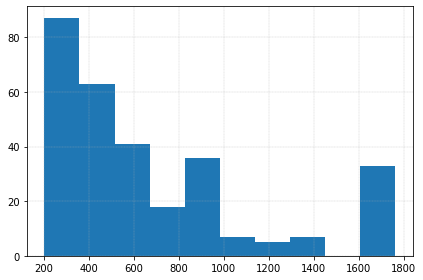

In [18]:
mint.peaklist.rt.hist()

In [19]:
mint.ms_files = fns

mint.progress_bar

IntProgress(value=0, bar_style='info', description='Progress:', layout=Layout(width='90%'))

In [20]:
mint.run()

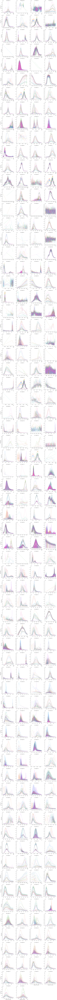

In [21]:
mint.plot_peak_shapes()

In [ ]:
df = ms_file_to_df(fns[0])

In [ ]:
df